# Holocene millennial-scale varibility within the Indo-Pacific Warm Pool: A preliminary investigation

This notebook runs through a preliminary analysis of Holocene (0-10ky BP) records from the Indo-Pacific Warm Pool (IPWP, 15S-15N, 95E-150E) using the PAGES Temp12k database ([Kaufman et al., 2020](https://www.nature.com/articles/s41597-020-0445-3)) and illustrates the use of the [Lipdverse graphDB](https://linkedearth.graphdb.mint.isi.edu) with the [Pyleoclim software](https://pyleoclim-util.readthedocs.io/en/master/) ([Khider et al., 2022](https://agupubs.onlinelibrary.wiley.com/doi/abs/10.1029/2022PA004509)).  

The goal of this notebook is to illustrate how standardization facilitates the creation of databases and analysis tools to reduce the time to science. 

**Table of Contents**
* [The MD98-2181 record](#MD81)
* [Querying the GraphDB](#query)
    * [Data Cleaning](#db)
* [Data exploration](#dataexploration)
* [Spectral Analysis](#spectral)
    * [Effect of trends on the power spectrum density](#trends)
        * [Detrending](#detrending)
            * [Savitzky-Golay method](#sg)
            * [Empirical Mode Decomposition method](#emd)
        * [Using a low-pass filter for detrending](#filter)
* [Discussion](#discussion)
    * [Effect of resolution](#res)
    * [Effect of record length](#length)

In [1]:
# Querying the database
import json
import requests
import pandas as pd
import numpy as np
import io

#Analysis software
import pyleoclim as pyleo

#Plotting
import matplotlib.pyplot as plt
from matplotlib import gridspec
import seaborn as sns
import cartopy.crs as ccrs

# Peak Detection
from scipy.signal import find_peaks

## <a name=MD81>The MD98-2181 record</a>

Based on a sea surface temperature record obtained from *G. ruber* Mg/Ca, [Khider et al., 2014](https://agupubs.onlinelibrary.wiley.com/doi/pdf/10.1002/2013PA002534) found significant millennial-scale variability in the IPWP (marine sediment core MD98-2181, 6.45N, 125.83E).

Let's load the record, store in the Linked Paleo Data (LiPD, [McKay and Emile-Geay, 2016](https://cp.copernicus.org/articles/12/1093/2016/)) format: 

In [34]:
D=pyleo.Lipd('MD982181.Khider.2014.lpd')

Disclaimer: LiPD files may be updated and modified to adhere to standards

reading: MD982181.Khider.2014.lpd
14.23 MB :That's a big file! This may take a while to load...
Finished read: 1 record


Select SST from the file:

In [35]:
ts_MD81 = D.to_LipdSeries()

extracting paleoData...
extracting: MD982181.Khider.2014
Created time series: 16 entries
0 :  MD982181.Khider.2014 :  marine sediment :  depth_cm
1 :  MD982181.Khider.2014 :  marine sediment :  mg/ca-g.rub-w
2 :  MD982181.Khider.2014 :  marine sediment :  d18og.rub-w
3 :  MD982181.Khider.2014 :  marine sediment :  age_calyrbp
4 :  MD982181.Khider.2014 :  marine sediment :  sst
5 :  MD982181.Khider.2014 :  marine sediment :  δ18osw
6 :  MD982181.Khider.2014 :  marine sediment :  depth
7 :  MD982181.Khider.2014 :  marine sediment :  age_calyrbp
8 :  MD982181.Khider.2014 :  marine sediment :  d18oc.mund
9 :  MD982181.Khider.2014 :  marine sediment :  depth_cm
10 :  MD982181.Khider.2014 :  marine sediment :  mg/ca-g.rub-w
11 :  MD982181.Khider.2014 :  marine sediment :  d18og.rub-w
12 :  MD982181.Khider.2014 :  marine sediment :  d13cg.rub-w
13 :  MD982181.Khider.2014 :  marine sediment :  d18oc.mund
14 :  MD982181.Khider.2014 :  marine sediment :  d13cc.mund
15 :  MD982181.Khider.2014 :  

Enter the number of the variable you wish to use:  4


Pyleoclim has a [dashboard feature](https://pyleoclim-util.readthedocs.io/en/master/core/api.html#pyleoclim.core.lipdseries.LipdSeries.dashboard) that takes advantage of the standard LiPD format to plot the timeseries, map the location of the record, and perform spectral analysis. Here, we will use the default Lomb-Scargle method, which is appropriate for evenly-spaced data, with an ensemble of 200 AR1 models to assess significance. 

Performing spectral analysis on individual series: 100%|█| 200/200 [00:04<00:00,


(<Figure size 1100x800 with 4 Axes>,
 {'ts': <AxesSubplot: xlabel='Age [yr BP]', ylabel='sst [deg C]'>,
  'dts': <AxesSubplot: xlabel='Counts'>,
  'map': <GeoAxesSubplot: >,
  'spec': <AxesSubplot: xlabel='Period [yrs]', ylabel='PSD'>})

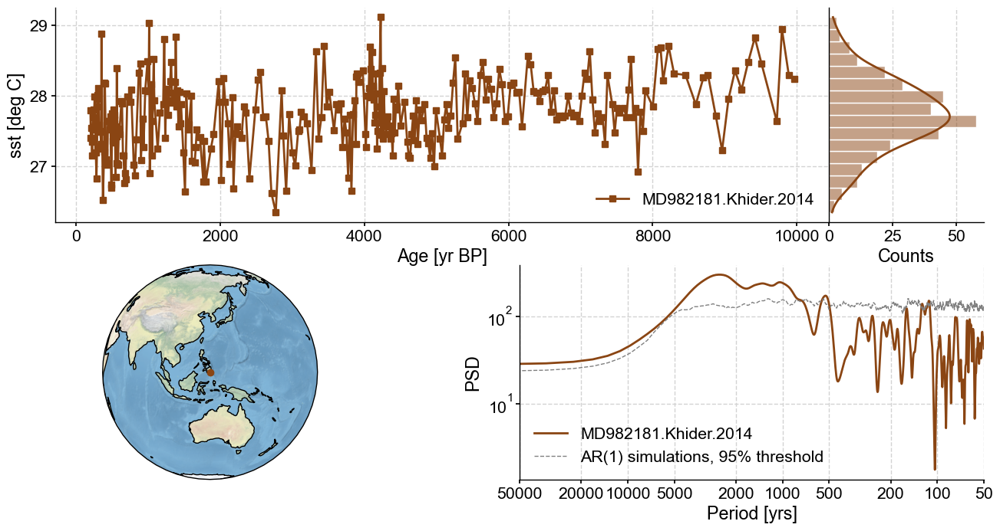

In [76]:
ts_MD81.dashboard(metadata=False)

The record displays significant millennial-scale variability, similar to the what was found in the original study. Let's rerun the analysis by first detrending the data using a Savitzky-Golay filter:

<AxesSubplot: xlabel='Age [yr BP]', ylabel='sst [deg C]'>

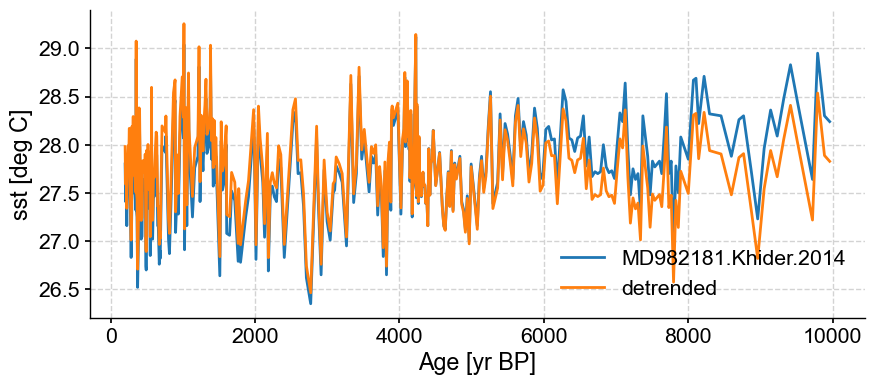

In [77]:
ts_detrend = ts_MD81.detrend(method='savitzky-golay')
ts_detrend.value=ts_detrend.value+np.mean(ts_MD81.value) #add the mean back
fig,ax=ts.plot()
ts_detrend.plot(ax=ax,label='detrended')

The detrended removed the linear trend over the Holocene, characteristic of Mg/Ca records from this region ([Linsley et al., 2010](https://www.nature.com/articles/ngeo920)). Let's run spectral analysis again with a larger number of AR1 surrogates to get a "smoother" 95% confidence interval line. This is important since we will be using a numerical method to estimate the peaks and their significance.

In [71]:
psd = ts_detrend.standardize().spectral(method='lomb_scargle', freq_method='lomb_scargle').signif_test(number=5000)

Performing spectral analysis on individual series: 100%|█| 5000/5000 [01:43<00:0


And plot the resulting PSD:

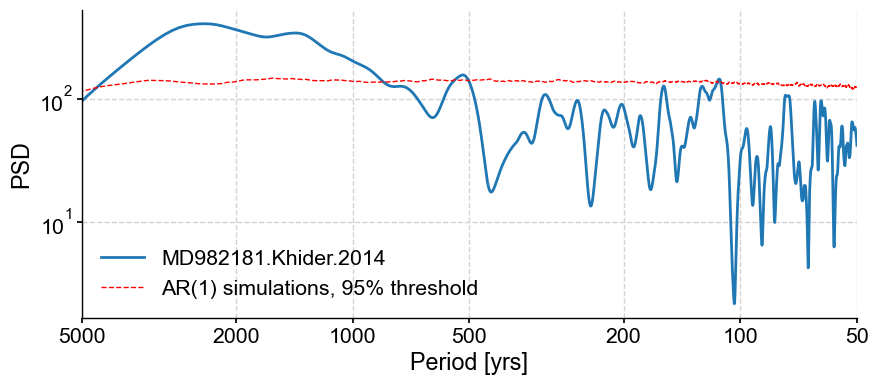

In [74]:
fig,ax = psd.plot(xlim=[0,5000])
ax.invert_xaxis()

The result indicates significant power in the millennial-band with no well-defined "peaks". However, since we will be analyzing a database, let's use the [Scipy find_peaks](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.find_peaks.html) functionality to offer a basis for comparison with other records within the IPWP. 

In [73]:
peak_idx = find_peaks(psd.amplitude)[0]
peak_period=[]
for item in peak_idx:
    if psd.amplitude[item]>psd.signif_qs.psd_list[0].amplitude[item]:
        if (1./psd.frequency[item]>=750) & (1./psd.frequency[item]<=3000):
            peak_period.append(1./psd.frequency[item]) 

peak_period

[2407.1428571428573, 1404.1666666666665]

## <a name='query'>Querying the GraphDB</a>

Upon publication, the global compilation of quality-controlled, published, temperature-sensitive proxy records extending back 12,000 years through the Holocene (Temp12k) was made available in the Linked Paleo Data (LiPD, [Mckay and Emile-Geay (2016)](https://cp.copernicus.org/articles/12/1093/2016/)) format. Since this format is compatible with the [LinkedEarth Ontology](http://linked.earth/Ontology/release/index.html), the data and associated metadata has also been made available through a [graph database](https://linkedearth.graphdb.mint.isi.edu).

To investigate millennial-scale variability within the IPWP over the Holocene, we search for records with the following characteristics:
* Temperature records
* Location within the IPWP (bounding box from 15S to 15N and 95E to 150E)
* Resolution of at least 200 years

In [2]:
url = 'https://linkedearth.graphdb.mint.isi.edu/repositories/LiPDVerse'

query = """
PREFIX le: <http://linked.earth/ontology#>
select ?val ?timeval ?varunits ?timeunits ?dsname ?lat ?lon ?alt ?archive ?varname ?timevarname ?QAlabel ?medianRes ?poxyLumps ?proxyGeneral ?proxyDetail ?varID FROM <http://linked.earth/lipd/Temp12k1_1_0> where { 
    ?ds le:name ?dsname .
        OPTIONAL {?ds le:proxyArchiveType ?archive .} 
    ?ds le:includesPaleoData ?data .
    
    ?ds le:collectedFrom ?loc . 
    ?loc le:wgs84_Lat ?lat .
        FILTER(?lat<15 && ?lat>-15) 
    ?loc le:wgs84_Long ?lon .
        FILTER(?lon<153 && ?lon>95)
    ?loc le:wgs84_Alt ?alt .
   
    ?data le:foundInMeasurementTable ?table .
    ?table le:includesVariable ?var .
    ?var le:name ?varname .
        FILTER regex(?varname, "temperature.*")
        OPTIONAL {?var le:useInGlobalTemperatureAnalysis ?QAlabel .} 
    ?var le:hasVariableID ?varID .
    ?var le:hasValues ?val
        OPTIONAL{?var le:hasUnits ?varunits .}
    ?var le:medianRes12k ?medianRes .
        FILTER (?medianRes<200)
        OPTIONAL {?var le:proxyLumps ?proxyLumps .}
        OPTIONAL {?var le:proxyGeneral ?proxyGeneral .}
        OPTIONAL {?var le:proxyDetail ?proxyDetail .}
                
    
    ?table le:includesVariable ?timevar .
    ?timevar le:name ?timevarname .
        VALUES ?timevarname {"year" "age"} .
    ?timevar le:hasValues ?timeval .
        OPTIONAL{?timevar le:hasUnits ?timeunits .}
}
"""

response = requests.post(url, data = {'query': query})

data = io.StringIO(response.text)
df = pd.read_csv(data, sep=",")

# Make list from the values string
df['val']=df['val'].apply(lambda row : np.fromstring(row.strip("[]"), sep=','))
df['timeval']=df['timeval'].apply(lambda row : np.fromstring(row.strip("[]"), sep=','))

df.head()

,val,timeval,varunits,timeunits,dsname,lat,lon,alt,archive,varname,timevarname,QAlabel,medianRes,poxyLumps,proxyGeneral,proxyDetail,varID
0,"[28.05, 27.66, 28.2, 27.84, 26.62, 27.66, 27.8...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.360,-688,MarineSediment,temperature,age,True,50.0,NaN,Mg/Ca,ruber white,R6WsAc5ruph
1,"[30.7791, 30.199, 30.9603, 30.4859, 28.7948, 3...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.360,-688,MarineSediment,temperature,age,NaN,50.0,NaN,Mg/Ca,ruber white,R7fm0TgPac4_SST_from_planktic0x2EMgCa
2,"[28.05, 27.66, 28.2, 27.84, 26.62, 27.66, 27.8...","[235.0, 547.0, 857.0, 1166.0, 1473.0, 1780.0, ...",degC,BP,GiK18515_3,-3.6298,119.360,-688,MarineSediment,temperature,age,True,50.0,NaN,Mg/Ca,ruber white,R6WsAc5ruph
3,"[30.7791, 30.199, 30.9603, 30.4859, 28.7948, 3...","[235.0, 547.0, 857.0, 1166.0, 1473.0, 1780.0, ...",degC,BP,GiK18515_3,-3.6298,119.360,-688,MarineSediment,temperature,age,NaN,50.0,NaN,Mg/Ca,ruber white,R7fm0TgPac4_SST_from_planktic0x2EMgCa
4,"[nan, 30.1467919826531, nan, 30.1735219346169,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.832,-1878,MarineSediment,temperature,age,NaN,160.0,NaN,alkenone,UK'37,T2L_MD06_3075_uk37_SST_from_uk37


### <a name='db'>Data Cleaning</a>

Our query returned the following number of records:

In [3]:
df.shape[0]

41

Let's see on which [ProxyArchive](http://linked.earth/Ontology/release/archive/1.0.0/index-en.html) the measurements were made:

In [4]:
df.archive.unique()

array(['MarineSediment'], dtype=object)

All of the records are marine sedimentary records. Let's see which proxies were used:

In [5]:
df.proxyGeneral.unique()

array(['Mg/Ca', 'alkenone', 'isotope'], dtype=object)

Let's make sure that all the time values are reported in years BP (instead of ky BP):

In [6]:
df.timeunits.unique()

array(['BP', 'cal years BP'], dtype=object)

Let's make sure that we are only using unique variable IDs (no duplicates)

In [7]:
df.drop_duplicates(subset=['varID'],inplace=True)
df.head()

,val,timeval,varunits,timeunits,dsname,lat,lon,alt,archive,varname,timevarname,QAlabel,medianRes,poxyLumps,proxyGeneral,proxyDetail,varID
0,"[28.05, 27.66, 28.2, 27.84, 26.62, 27.66, 27.8...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,age,True,50.000,NaN,Mg/Ca,ruber white,R6WsAc5ruph
1,"[30.7791, 30.199, 30.9603, 30.4859, 28.7948, 3...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,age,NaN,50.000,NaN,Mg/Ca,ruber white,R7fm0TgPac4_SST_from_planktic0x2EMgCa
4,"[nan, 30.1467919826531, nan, 30.1735219346169,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,age,NaN,160.000,NaN,alkenone,UK'37,T2L_MD06_3075_uk37_SST_from_uk37
5,"[30.6218389925529, nan, 30.9747202389286, nan,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,age,NaN,60.000,NaN,isotope,ruber,T2L_MD06_3075_d18o_ruber_SST_from_d18o_ruber
6,"[26.7984, 26.2896, 26.841, 26.7689, 26.4507, 2...","[470.123, 544.246, 618.368, 692.491, 766.614, ...",degC,cal years BP,GeoB10069_3.Gibbons.2014,-9.0099,120.0153,-1250,MarineSediment,temperature,age,NaN,74.122,NaN,Mg/Ca,ruber,T2L_GeoB10069_3_mgca_ruber_SST_from_mgca_ruber


After removal of duplicates, we have the following number of records left:

In [8]:
df.shape[0]

39

We removed two duplicates. 

Everything seems in order for preliminary data analysis!

## <a name=dataexploration>Data Exploration</a>

Let's first make a simple map of where the data is located. Pyleoclim has a [functionality](https://pyleoclim-util.readthedocs.io/en/master/core/api.html#pyleoclim.core.lipd.Lipd.mapAllArchive) to plot by archive from a LiPD-formatted object, but we really need more granularity here since we have the same archive but different proxies. Therefore, we will be using the [underlying function](https://pyleoclim-util.readthedocs.io/en/master/utils/introduction.html#module-pyleoclim.utils.mapping) directly:

(<Figure size 640x480 with 1 Axes>, <GeoAxesSubplot: >)

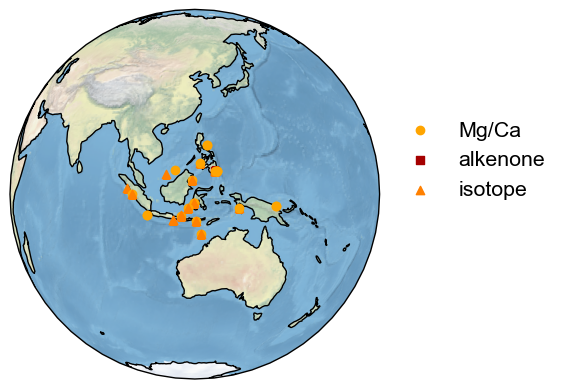

In [9]:
plot_default={'Mg/Ca':['#ffa500','o'],
             'alkenone':['#a50000','s'],
             'isotope':['#ff8000','^']}

marker=[]
color=[]
for _,row in df.iterrows():
    marker.append(plot_default[row['proxyGeneral']][1])
    color.append(plot_default[row['proxyGeneral']][0])

# center the projection on the data
proj = {'central_latitude':df['lat'].mean(),'central_longitude':df['lon'].mean()}

pyleo.utils.mapping.map(lat=df['lat'], lon=df['lon'], criteria = df['proxyGeneral'], 
                        marker=marker, color=color, projection='Orthographic',proj_default=proj,
                        background = True, borders = False, rivers = False, lakes = False,
                       lgd_kwargs={'bbox_to_anchor':(1.5,0.75)})

Let's create a [stackplot](https://pyleoclim-util.readthedocs.io/en/master/core/api.html#pyleoclim.core.multipleseries.MultipleSeries.stackplot). First we need to create [Pyleoclim Series]() for each row in the DataFrame. We will store them in a dictionary, whose key will be the unique variable ID:

In [10]:
ts_dict={}
for _,row in df.iterrows():
    ts_dict[row['varID']]=pyleo.Series(time=row['timeval'],value=row['val'],
                                       time_name=row['timevarname'],value_name=row['varname'],
                                       time_unit=row['timeunits'], value_unit=row['varunits'],
                                       label=row['dsname']+'_'+row['proxyGeneral'])                            

Next, let's create a [Pyleoclim MultipleSeries](https://pyleoclim-util.readthedocs.io/en/master/core/api.html#multipleseries-pyleoclim-multipleseries) for all the records in the dictionary:

In [11]:
ms = pyleo.MultipleSeries(list(ts_dict.values()))

And plot!

(<Figure size 800x3000 with 40 Axes>,
 {0: <Axes: ylabel='temperature [degC]'>,
  1: <Axes: ylabel='temperature [degC]'>,
  2: <Axes: ylabel='temperature [degC]'>,
  3: <Axes: ylabel='temperature [degC]'>,
  4: <Axes: ylabel='temperature [degC]'>,
  5: <Axes: ylabel='temperature [degC]'>,
  6: <Axes: ylabel='temperature [degC]'>,
  7: <Axes: ylabel='temperature [degC]'>,
  8: <Axes: ylabel='temperature [degC]'>,
  9: <Axes: ylabel='temperature [degC]'>,
  10: <Axes: ylabel='temperature [degC]'>,
  11: <Axes: ylabel='temperature [degC]'>,
  12: <Axes: ylabel='temperature [degC]'>,
  13: <Axes: ylabel='temperature [degC]'>,
  14: <Axes: ylabel='temperature [degC]'>,
  15: <Axes: ylabel='temperature [degC]'>,
  16: <Axes: ylabel='temperature [degC]'>,
  17: <Axes: ylabel='temperature [degC]'>,
  18: <Axes: ylabel='temperature [degC]'>,
  19: <Axes: ylabel='temperature [degC]'>,
  20: <Axes: ylabel='temperature [degC]'>,
  21: <Axes: ylabel='temperature [degC]'>,
  22: <Axes: ylabel='tempe

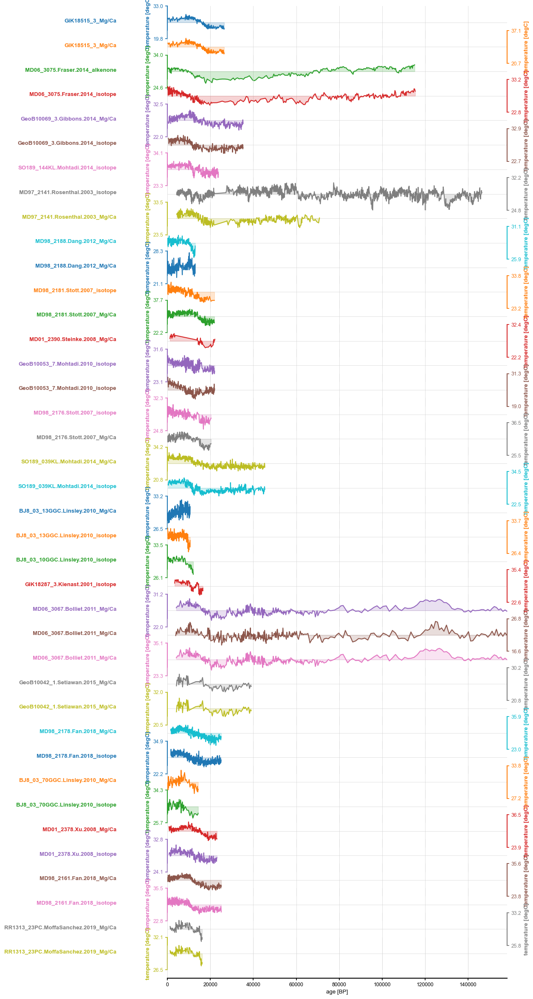

In [12]:
ms.stackplot(figsize = (8,30))

Some of the records in the database are considerably longer than the Holocene. Let's [slice](https://pyleoclim-util.readthedocs.io/en/master/core/api.html#pyleoclim.core.series.Series.slice) (0-10,000 yr BP) them and replot:

In [13]:
ts_dict_slice = {}
for key in ts_dict.keys():
    ts_dict_slice[key]=ts_dict[key].slice([0,10000])

(<Figure size 800x3000 with 40 Axes>,
 {0: <Axes: ylabel='temperature [degC]'>,
  1: <Axes: ylabel='temperature [degC]'>,
  2: <Axes: ylabel='temperature [degC]'>,
  3: <Axes: ylabel='temperature [degC]'>,
  4: <Axes: ylabel='temperature [degC]'>,
  5: <Axes: ylabel='temperature [degC]'>,
  6: <Axes: ylabel='temperature [degC]'>,
  7: <Axes: ylabel='temperature [degC]'>,
  8: <Axes: ylabel='temperature [degC]'>,
  9: <Axes: ylabel='temperature [degC]'>,
  10: <Axes: ylabel='temperature [degC]'>,
  11: <Axes: ylabel='temperature [degC]'>,
  12: <Axes: ylabel='temperature [degC]'>,
  13: <Axes: ylabel='temperature [degC]'>,
  14: <Axes: ylabel='temperature [degC]'>,
  15: <Axes: ylabel='temperature [degC]'>,
  16: <Axes: ylabel='temperature [degC]'>,
  17: <Axes: ylabel='temperature [degC]'>,
  18: <Axes: ylabel='temperature [degC]'>,
  19: <Axes: ylabel='temperature [degC]'>,
  20: <Axes: ylabel='temperature [degC]'>,
  21: <Axes: ylabel='temperature [degC]'>,
  22: <Axes: ylabel='tempe

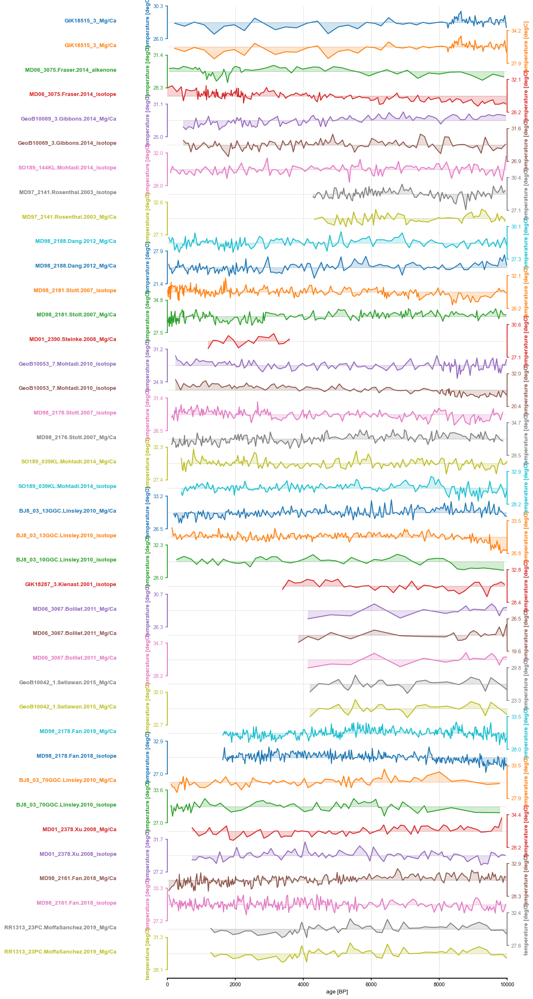

In [14]:
ms_slice = pyleo.MultipleSeries(list(ts_dict_slice.values()))
ms_slice.stackplot(figsize = (8,30))

Some of these records are also very short for our application. Let's only keep the ones that have at least 7000 years of data. 

In [15]:
ts_dict_slice_long = {}
for key in ts_dict_slice.keys():
    time = ts_dict_slice[key].time
    timespan = np.max(time)-np.min(time)
    if timespan<=7000:
        pass
    else:
        ts_dict_slice_long[key]=ts_dict_slice[key]

(<Figure size 800x3000 with 31 Axes>,
 {0: <Axes: ylabel='temperature [degC]'>,
  1: <Axes: ylabel='temperature [degC]'>,
  2: <Axes: ylabel='temperature [degC]'>,
  3: <Axes: ylabel='temperature [degC]'>,
  4: <Axes: ylabel='temperature [degC]'>,
  5: <Axes: ylabel='temperature [degC]'>,
  6: <Axes: ylabel='temperature [degC]'>,
  7: <Axes: ylabel='temperature [degC]'>,
  8: <Axes: ylabel='temperature [degC]'>,
  9: <Axes: ylabel='temperature [degC]'>,
  10: <Axes: ylabel='temperature [degC]'>,
  11: <Axes: ylabel='temperature [degC]'>,
  12: <Axes: ylabel='temperature [degC]'>,
  13: <Axes: ylabel='temperature [degC]'>,
  14: <Axes: ylabel='temperature [degC]'>,
  15: <Axes: ylabel='temperature [degC]'>,
  16: <Axes: ylabel='temperature [degC]'>,
  17: <Axes: ylabel='temperature [degC]'>,
  18: <Axes: ylabel='temperature [degC]'>,
  19: <Axes: ylabel='temperature [degC]'>,
  20: <Axes: ylabel='temperature [degC]'>,
  21: <Axes: ylabel='temperature [degC]'>,
  22: <Axes: ylabel='tempe

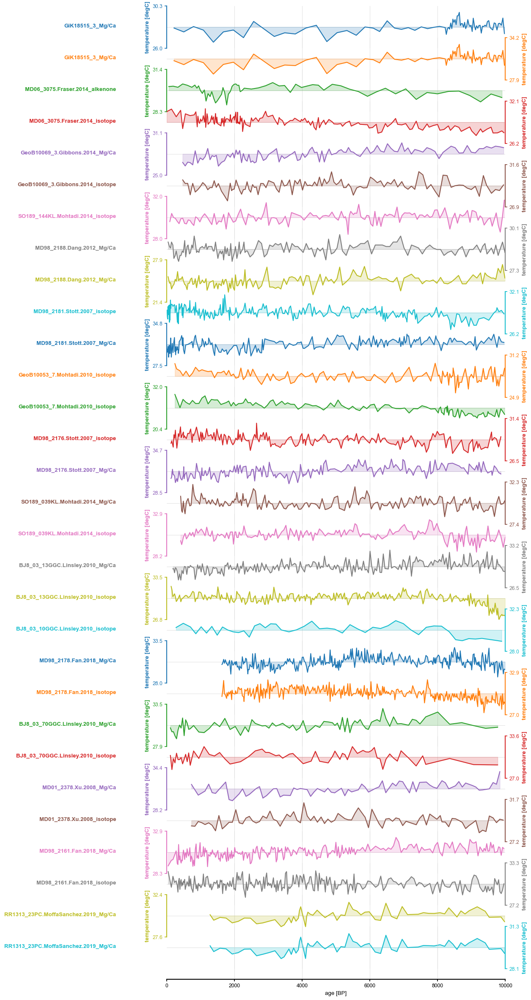

In [16]:
ms_slice_long = pyleo.MultipleSeries(list(ts_dict_slice_long.values()))
ms_slice_long.stackplot(figsize = (8,30))

Let's remake the map of the existing records:

In [17]:
record_keep=list(ts_dict_slice_long.keys())
df_final = df[df['varID'].isin(record_keep)]

df_final.head()

,val,timeval,varunits,timeunits,dsname,lat,lon,alt,archive,varname,timevarname,QAlabel,medianRes,poxyLumps,proxyGeneral,proxyDetail,varID
0,"[28.05, 27.66, 28.2, 27.84, 26.62, 27.66, 27.8...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,age,True,50.000,NaN,Mg/Ca,ruber white,R6WsAc5ruph
1,"[30.7791, 30.199, 30.9603, 30.4859, 28.7948, 3...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,age,NaN,50.000,NaN,Mg/Ca,ruber white,R7fm0TgPac4_SST_from_planktic0x2EMgCa
4,"[nan, 30.1467919826531, nan, 30.1735219346169,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,age,NaN,160.000,NaN,alkenone,UK'37,T2L_MD06_3075_uk37_SST_from_uk37
5,"[30.6218389925529, nan, 30.9747202389286, nan,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,age,NaN,60.000,NaN,isotope,ruber,T2L_MD06_3075_d18o_ruber_SST_from_d18o_ruber
6,"[26.7984, 26.2896, 26.841, 26.7689, 26.4507, 2...","[470.123, 544.246, 618.368, 692.491, 766.614, ...",degC,cal years BP,GeoB10069_3.Gibbons.2014,-9.0099,120.0153,-1250,MarineSediment,temperature,age,NaN,74.122,NaN,Mg/Ca,ruber,T2L_GeoB10069_3_mgca_ruber_SST_from_mgca_ruber


In [18]:
df_final.shape[0]

30

We have 30 records left after our data cleaning.

(<Figure size 640x480 with 1 Axes>, <GeoAxesSubplot: >)

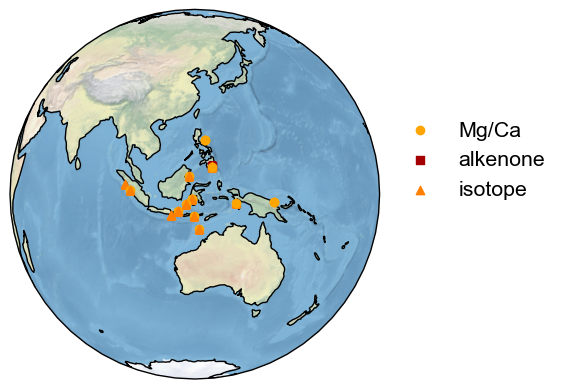

In [19]:
plot_default={'Mg/Ca':['#ffa500','o'],
             'alkenone':['#a50000','s'],
             'isotope':['#ff8000','^']}

marker=[]
color=[]
for _,row in df_final.iterrows():
    marker.append(plot_default[row['proxyGeneral']][1])
    color.append(plot_default[row['proxyGeneral']][0])

# center the projection on the data
proj = {'central_latitude':df_final['lat'].mean(),'central_longitude':df_final['lon'].mean()}

pyleo.utils.mapping.map(lat=df_final['lat'], lon=df_final['lon'], criteria = df_final['proxyGeneral'], 
                        marker=marker, color=color, projection='Orthographic',proj_default=proj,
                        background = True, borders = False, rivers = False, lakes = False,
                       lgd_kwargs={'bbox_to_anchor':(1.5,0.75)})

## <a name=spectral>Spectral Analysis</a>

For prelimianry data analysis, let's run [spectral analysis](https://pyleoclim-util.readthedocs.io/en/master/core/api.html#pyleoclim.core.series.Series.spectral) using the Lomb-Scargle method, without prior detrending. The Lomb-Scargle method is a good default method to start our investigation since it can handle unevenly-spaced data. Let's also do very minimal pre-processing (just standardization) so we can see the impact of pre-processing on our results in subsequent steps.

**Note:** This might take a few minutes to complete

In [20]:
psd_dict={}
for key in ts_dict_slice_long.keys():
    psd_dict[key]=ts_dict_slice_long[key].standardize().spectral(method='lomb_scargle', freq_method='lomb_scargle').signif_test(number=5000)

Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:10<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:10<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:08<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:29<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:15<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:15<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:22<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:23<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:25<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:59<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:42<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:18<00:0
Performing spectral analysis

Let's plot the resulting PSDs:

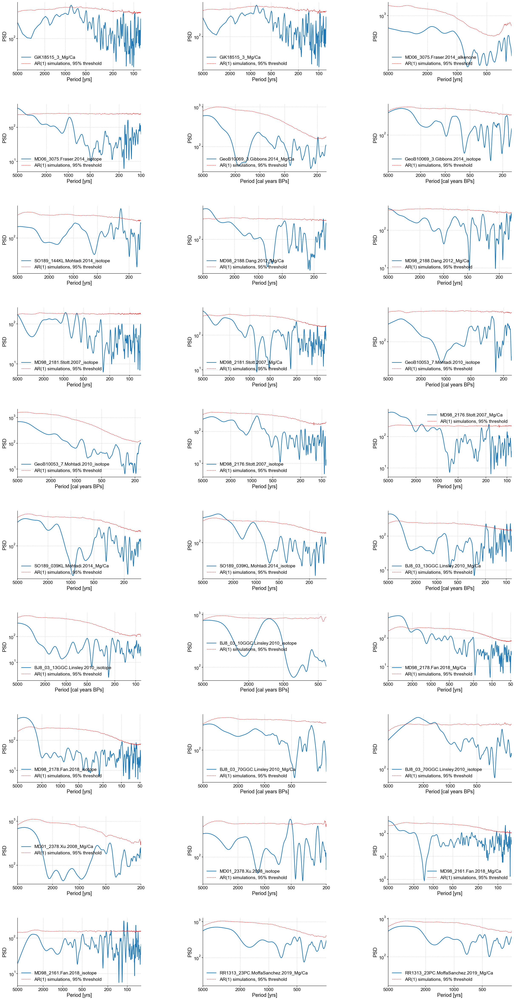

In [28]:
fig, axs = plt.subplots(10,3, figsize=(30,60))
fig.subplots_adjust(hspace = .5, wspace=.5)
axs = axs.ravel()

c=list(psd_dict.keys())

for i in range(30):
    psd_dict[c[i]].plot(xlim=[0,5000], ax=axs[i])
    axs[i].invert_xaxis()

A quick visual inspection indicates that very few records seem to have any sort of millenial-scale variability. Let's identify significant peaks (if any) in the millennial band (defined as 750-3000 years periods):

In [71]:
peaks = {}
peak_periods=[]
peak_present=[]

for key in psd_dict.keys():
    peak_idx = find_peaks(psd_dict[key].amplitude)[0]
    peak_period=[]
    for item in peak_idx:
        if psd_dict[key].amplitude[item]>psd_dict[key].signif_qs.psd_list[0].amplitude[item]:
            if (1./psd_dict[key].frequency[item]>=750) & (1./psd_dict[key].frequency[item]<=3000):
                peak_period.append(1./psd_dict[key].frequency[item])               
    if len(peak_period)==0:
        peak_present.append(False)
    else:
        peak_present.append(True)
    peak_periods.append(peak_period)
                                

Let's append two columns to our dataframe to summarize the results:

In [77]:
df_peaks = df_final.copy()

df_peaks['peak present']=peak_present
df_peaks['peak period']=peak_periods

df_peaks

,val,timeval,varunits,timeunits,dsname,lat,lon,alt,archive,varname,timevarname,QAlabel,medianRes,poxyLumps,proxyGeneral,proxyDetail,varID,peak present,peak period
0,"[28.05, 27.66, 28.2, 27.84, 26.62, 27.66, 27.8...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,age,True,50.000,NaN,Mg/Ca,ruber white,R6WsAc5ruph,True,[815.2258064516129]
1,"[30.7791, 30.199, 30.9603, 30.4859, 28.7948, 3...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,age,NaN,50.000,NaN,Mg/Ca,ruber white,R7fm0TgPac4_SST_from_planktic0x2EMgCa,True,[815.2258064516129]
4,"[nan, 30.1467919826531, nan, 30.1735219346169,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,age,NaN,160.000,NaN,alkenone,UK'37,T2L_MD06_3075_uk37_SST_from_uk37,False,[]
5,"[30.6218389925529, nan, 30.9747202389286, nan,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,age,NaN,60.000,NaN,isotope,ruber,T2L_MD06_3075_d18o_ruber_SST_from_d18o_ruber,False,[]
6,"[26.7984, 26.2896, 26.841, 26.7689, 26.4507, 2...","[470.123, 544.246, 618.368, 692.491, 766.614, ...",degC,cal years BP,GeoB10069_3.Gibbons.2014,-9.0099,120.0153,-1250,MarineSediment,temperature,age,NaN,74.122,NaN,Mg/Ca,ruber,T2L_GeoB10069_3_mgca_ruber_SST_from_mgca_ruber,False,[]
7,"[29.8515875363455, 29.4545470170622, 29.466729...","[470.123, 544.246, 618.368, 692.491, 766.614, ...",degC,cal years BP,GeoB10069_3.Gibbons.2014,-9.0099,120.0153,-1250,MarineSediment,temperature,age,NaN,74.122,NaN,isotope,ruber,T2L_GeoB10069_3_d18o_ruber_SST_from_d18o_ruber,False,[]
8,"[29.6026764572587, 30.3623682354339, 29.990379...","[90.0, 145.0, 199.0, 254.0, 308.0, 363.0, 417....",degC,BP,SO189_144KL.Mohtadi.2014,1.1550,98.0660,-481,MarineSediment,temperature,age,NaN,74.000,NaN,isotope,ruber,T2L_SO189_144KL_d18o_ruber_SST_from_d18o_ruber,False,[]
11,"[29.2, 28.9, 28.8, 29.2, 29.0, 28.1, 28.3, 28....","[40.0, 80.0, 110.0, 140.0, 180.0, 210.0, 250.0...",degC,BP,MD98_2188.Dang.2012,14.8200,123.4900,-730,MarineSediment,temperature,age,NaN,70.000,NaN,Mg/Ca,ruber white,RVW8LmOBhyk,False,[]
12,"[25.3, 24.3, 24.4, 23.4, 23.9, 24.1, 24.9, 24....","[40.0, 80.0, 110.0, 140.0, 180.0, 210.0, 250.0...",degC,BP,MD98_2188.Dang.2012,14.8200,123.4900,-730,MarineSediment,temperature,age,NaN,70.000,NaN,Mg/Ca,P. obliquiloculata,RcqRo8jDUCp,False,[]
13,"[nan, 29.4983603571315, 28.5073400221219, 28.2...","[2.6, 7.8, 18.6, 29.8, 32.7, 41.4, 44.4, 53.5,...",degC,BP,MD98_2181.Stott.2007,6.3000,125.8200,-2114,MarineSediment,temperature,age,NaN,35.500,NaN,isotope,ruber,T2L_MD98_2181_d18o_ruber_SST_from_d18o_ruber,True,[930.5555555555555]


Let's have a more quantitative look at the results:

In [76]:
df_peaks[df_peaks['peak present']==True].shape[0]

5

Only 5 records (out of 30) display significant millennial-scale variability within this region. 

Let's make a histrogram of the peaks distribution:

Text(0.5, 0, 'Periods (yrs)')

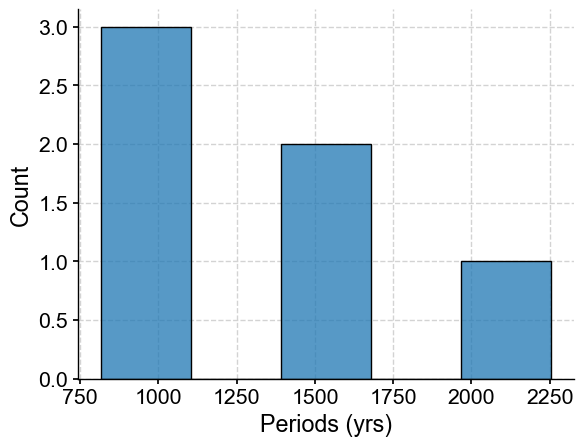

In [86]:
peaks_all=[]

for _,row in df_peaks.iterrows():
    if len(row['peak period'])>0:
        for item in row['peak period']:
            peaks_all.append(item)

sns.histplot(peaks_all, bins=5)
plt.xlabel('Periods (yrs)')

There is no particular clusters around specific periodicities in the 5 records. 

In this particular analysis, we only perform minimal pre-processing (i.e., standardizing before spectral analysis). However, trends can significantly impact the results of spectral analysis. Pyleoclim possesses several [detrending schemes](https://pyleoclim-util.readthedocs.io/en/master/core/api.html#pyleoclim.core.series.Series.detrend). Let's examine them: 

### <a name=trends>Effect of trends on the power spectrum density</a>

#### <a name=detrending>Detrending functions</a>

Pyleoclim offers several methods for detrending paleoclimate records:
* Linear - which is only applicable if the trend is linear. A quick look at the records indicates that some trends in these records are definitely nonlinear. Since we want to do a preliminary analysis on the entire database without taking into consideration each record individually, this may not be the method of choice.
* Savitzky-Golay - this method works by fitting the timeseries with a Savitzky-Golay filter and removing the filtered timeseries from the original signal
* EMD (Empiral Mode Decomposition) - this methods works through decomposition of the signal with several modes and removal of the last (few) modes, which are assumed to contain the trend.

The last two options would be the most applicable to all records in the database. Let's explore them. 

##### <a name=sg>Savitzky-Golay method</a>

In [21]:
ts_dict_slice_long_detrend_sg = {}
for key in ts_dict_slice_long.keys():
    ts_dict_slice_long_detrend_sg[key]=ts_dict_slice_long[key].detrend(method='savitzky-golay')

Let's plot our the detrended records on top of the original records:

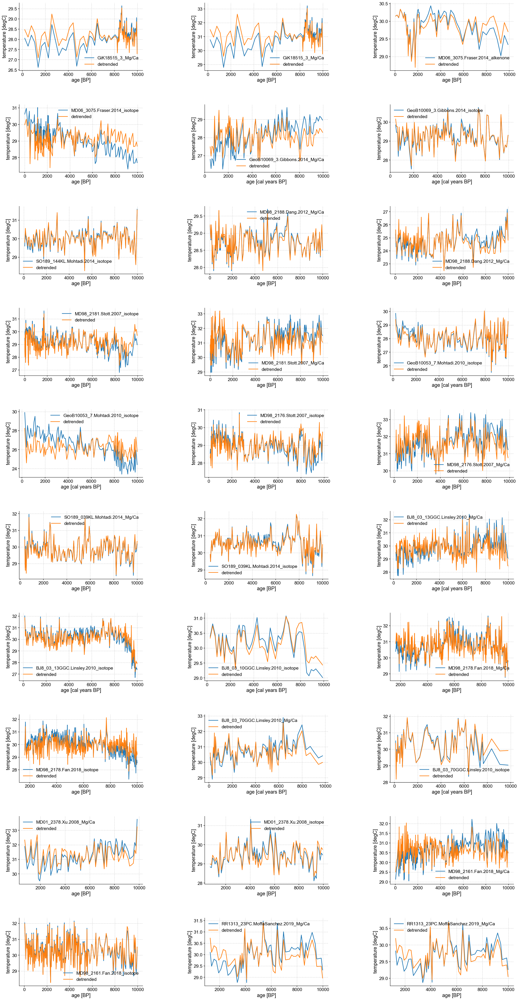

In [22]:
fig, axs = plt.subplots(10,3, figsize=(30,60))
fig.subplots_adjust(hspace = .5, wspace=.5)
axs = axs.ravel()

c=list(ts_dict_slice_long_detrend_sg.keys())

for i in range(30):
    ts_dict_slice_long[c[i]].plot(ax=axs[i])
    val = ts_dict_slice_long_detrend_sg[c[i]].value+np.mean(ts_dict_slice_long[c[i]].value)
    ts=pyleo.Series(time=ts_dict_slice_long_detrend_sg[c[i]].time,value=val,
                   time_name=ts_dict_slice_long_detrend_sg[c[i]].time_name,
                   value_name=ts_dict_slice_long_detrend_sg[c[i]].value_name,
                   time_unit=ts_dict_slice_long_detrend_sg[c[i]].time_unit,
                   value_unit=ts_dict_slice_long_detrend_sg[c[i]].value_unit)
    ts.plot(ax=axs[i], label='detrended')

For most of the records, the detrending method removed the most obvious trends in the data. For some records (for instance, BJ08-03-13GGC.Linsley.2010_isotope record), trends are still apparent in the record. This is not an unusual problem with this particular method (see the [documentation](https://pyleoclim-util.readthedocs.io/en/master/core/api.html#pyleoclim.core.series.Series.detrend) for another example of this problem): the window-length parameter is crucial in dictating the behavior of this function. Each record would need to be fitted individually through trial and error.

Right now, let's try to use default behavior of functions for our preliminary data analysis. If pre-processing is indeed important to the results, then time will be well spent in assigning the right parameter value for each record. 

Let's see if the EMD method performs better across the database.

##### <a name=emd>Empirical Mode Decomposition method</a>

Given the problem with the Savitzky-Golay filtering method above, let's consider removing the first two modes as the trend:

In [23]:
ts_dict_slice_long_detrend = {}
for key in ts_dict_slice_long.keys():
    ts_dict_slice_long_detrend[key]=ts_dict_slice_long[key].detrend(method='emd',n=2)

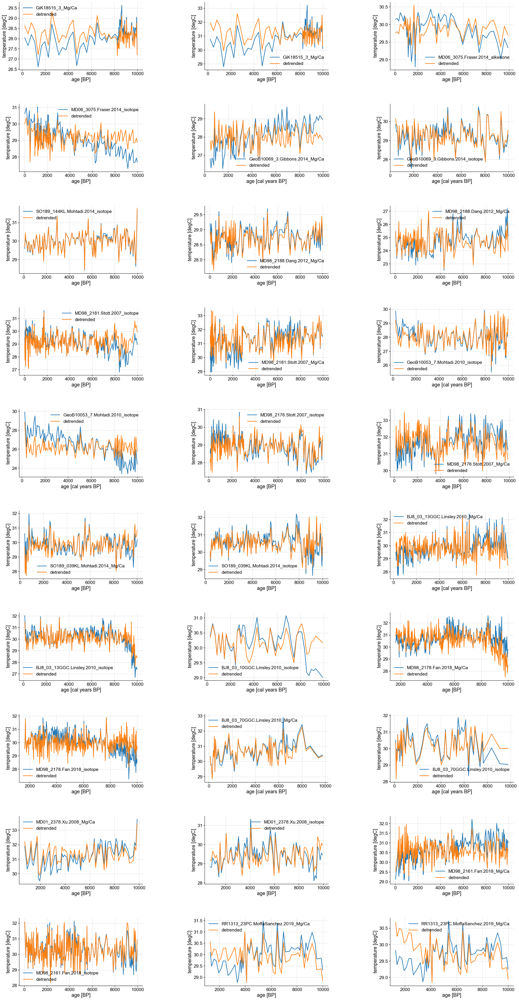

In [24]:
fig, axs = plt.subplots(10,3, figsize=(30,60))
fig.subplots_adjust(hspace = .5, wspace=.5)
axs = axs.ravel()

c=list(ts_dict_slice_long_detrend.keys())

for i in range(30):
    ts_dict_slice_long[c[i]].plot(ax=axs[i])
    val = ts_dict_slice_long_detrend[c[i]].value+np.mean(ts_dict_slice_long[c[i]].value)
    ts=pyleo.Series(time=ts_dict_slice_long_detrend[c[i]].time,value=val,
                   time_name=ts_dict_slice_long_detrend[c[i]].time_name,
                   value_name=ts_dict_slice_long_detrend[c[i]].value_name,
                   time_unit=ts_dict_slice_long_detrend[c[i]].time_unit,
                   value_unit=ts_dict_slice_long_detrend[c[i]].value_unit)
    ts.plot(ax=axs[i], label='detrended')
    

This method is not perfect for all records but performs slightly better on average. Let's use this detrending method for preliminary spectral analysis.

In [20]:
psd_dict_detrend={}
for key in ts_dict_slice_long_detrend.keys():
    psd_dict_detrend[key]=ts_dict_slice_long_detrend[key].standardize().spectral(method='lomb_scargle', freq_method='lomb_scargle').signif_test(number=5000)

Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:12<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:11<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:09<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:29<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:16<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:17<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:24<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:24<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:23<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [01:00<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:42<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:19<00:0
Performing spectral analysis

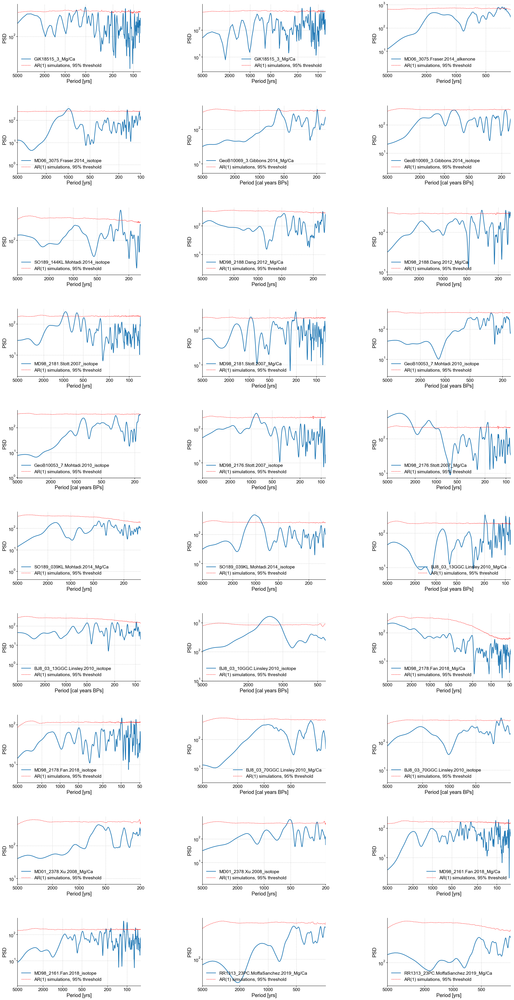

In [21]:
fig, axs = plt.subplots(10,3, figsize=(30,60))
fig.subplots_adjust(hspace = .5, wspace=.5)
axs = axs.ravel()

c=list(psd_dict_detrend.keys())

for i in range(30):
    psd_dict_detrend[c[i]].plot(xlim=[0,5000], ax=axs[i])
    axs[i].invert_xaxis()

Let's identify the number of records with significant millennial-scale variability and their corresponding "peaks":

In [23]:
peaks = {}
peak_periods=[]
peak_present=[]

for key in psd_dict_detrend.keys():
    peak_idx = find_peaks(psd_dict_detrend[key].amplitude)[0]
    peak_period=[]
    for item in peak_idx:
        if psd_dict_detrend[key].amplitude[item]>psd_dict_detrend[key].signif_qs.psd_list[0].amplitude[item]:
            if (1./psd_dict_detrend[key].frequency[item]>=750) & (1./psd_dict_detrend[key].frequency[item]<=3000):
                peak_period.append(1./psd_dict_detrend[key].frequency[item])               
    if len(peak_period)==0:
        peak_present.append(False)
    else:
        peak_present.append(True)
    peak_periods.append(peak_period)                      

In [24]:
df_peaks_detrend = df_final.copy()

df_peaks_detrend['peak present']=peak_present
df_peaks_detrend['peak period']=peak_periods

df_peaks_detrend

,val,timeval,varunits,timeunits,dsname,lat,lon,alt,archive,varname,timevarname,QAlabel,medianRes,poxyLumps,proxyGeneral,proxyDetail,varID,peak present,peak period
0,"[28.05, 27.66, 28.2, 27.84, 26.62, 27.66, 27.8...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,age,True,50.000,NaN,Mg/Ca,ruber white,R6WsAc5ruph,False,[]
1,"[30.7791, 30.199, 30.9603, 30.4859, 28.7948, 3...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,age,NaN,50.000,NaN,Mg/Ca,ruber white,R7fm0TgPac4_SST_from_planktic0x2EMgCa,False,[]
4,"[nan, 30.1467919826531, nan, 30.1735219346169,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,age,NaN,160.000,NaN,alkenone,UK'37,T2L_MD06_3075_uk37_SST_from_uk37,False,[]
5,"[30.6218389925529, nan, 30.9747202389286, nan,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,age,NaN,60.000,NaN,isotope,ruber,T2L_MD06_3075_d18o_ruber_SST_from_d18o_ruber,True,[987.8787878787878]
6,"[26.7984, 26.2896, 26.841, 26.7689, 26.4507, 2...","[470.123, 544.246, 618.368, 692.491, 766.614, ...",degC,cal years BP,GeoB10069_3.Gibbons.2014,-9.0099,120.0153,-1250,MarineSediment,temperature,age,NaN,74.122,NaN,Mg/Ca,ruber,T2L_GeoB10069_3_mgca_ruber_SST_from_mgca_ruber,False,[]
7,"[29.8515875363455, 29.4545470170622, 29.466729...","[470.123, 544.246, 618.368, 692.491, 766.614, ...",degC,cal years BP,GeoB10069_3.Gibbons.2014,-9.0099,120.0153,-1250,MarineSediment,temperature,age,NaN,74.122,NaN,isotope,ruber,T2L_GeoB10069_3_d18o_ruber_SST_from_d18o_ruber,True,[762.1309565217381]
8,"[29.6026764572587, 30.3623682354339, 29.990379...","[90.0, 145.0, 199.0, 254.0, 308.0, 363.0, 417....",degC,BP,SO189_144KL.Mohtadi.2014,1.1550,98.0660,-481,MarineSediment,temperature,age,NaN,74.000,NaN,isotope,ruber,T2L_SO189_144KL_d18o_ruber_SST_from_d18o_ruber,False,[]
11,"[29.2, 28.9, 28.8, 29.2, 29.0, 28.1, 28.3, 28....","[40.0, 80.0, 110.0, 140.0, 180.0, 210.0, 250.0...",degC,BP,MD98_2188.Dang.2012,14.8200,123.4900,-730,MarineSediment,temperature,age,NaN,70.000,NaN,Mg/Ca,ruber white,RVW8LmOBhyk,False,[]
12,"[25.3, 24.3, 24.4, 23.4, 23.9, 24.1, 24.9, 24....","[40.0, 80.0, 110.0, 140.0, 180.0, 210.0, 250.0...",degC,BP,MD98_2188.Dang.2012,14.8200,123.4900,-730,MarineSediment,temperature,age,NaN,70.000,NaN,Mg/Ca,P. obliquiloculata,RcqRo8jDUCp,False,[]
13,"[nan, 29.4983603571315, 28.5073400221219, 28.2...","[2.6, 7.8, 18.6, 29.8, 32.7, 41.4, 44.4, 53.5,...",degC,BP,MD98_2181.Stott.2007,6.3000,125.8200,-2114,MarineSediment,temperature,age,NaN,35.500,NaN,isotope,ruber,T2L_MD98_2181_d18o_ruber_SST_from_d18o_ruber,True,[930.5555555555555]


In [25]:
df_peaks_detrend[df_peaks_detrend['peak present']==True].shape[0]

8

With some amount of pre-processing, eight records now display singificant periodicities. 

Text(0.5, 0, 'Periods (yrs)')

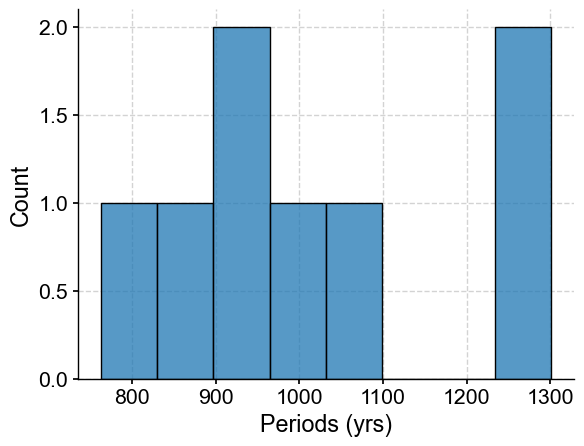

In [27]:
peaks_all=[]

for _,row in df_peaks_detrend.iterrows():
    if len(row['peak period'])>0:
        for item in row['peak period']:
            peaks_all.append(item)

sns.histplot(peaks_all, bins=8)
plt.xlabel('Periods (yrs)')

However, there doesn't seem to be particular periodicities standing out across the records.

Another option for detrending would be to pass a low-pass filter on the data and removing the filtered data from the original data. Let's explore this option next.

#### <a name=filter>Working with filters</a>

Pyleoclim has several [filtering methods](https://pyleoclim-util.readthedocs.io/en/master/core/api.html#pyleoclim.core.series.Series.filter) beyong Savitzky-Golay. Here let's use a [Lanczos](https://scitools.org.uk/iris/docs/v1.2/examples/graphics/SOI_filtering.html) with a cutoff scale of 4000 years:

In [25]:
ts_dict_slice_long_filter = {}
for key in ts_dict_slice_long.keys():
    ts_filt = ts_dict_slice_long[key].interp().filter(cutoff_scale = 4000, method = 'lanczos')
    y = np.interp(ts_dict_slice_long[key].time, ts_filt.time,ts_filt.value)
    ts_dict_slice_long_filter[key]=pyleo.Series(time=ts_dict_slice_long[key].time,
                                                 value=ts_dict_slice_long[key].value-y+np.mean(ts_dict_slice_long[key].value),
                                                 time_name=ts_dict_slice_long[key].time_name,
                                                 value_name=ts_dict_slice_long[key].value_name,
                                                 time_unit=ts_dict_slice_long[key].time_unit,
                                                 value_unit=ts_dict_slice_long[key].value_unit,
                                                 label = ts_dict_slice_long[key].label)

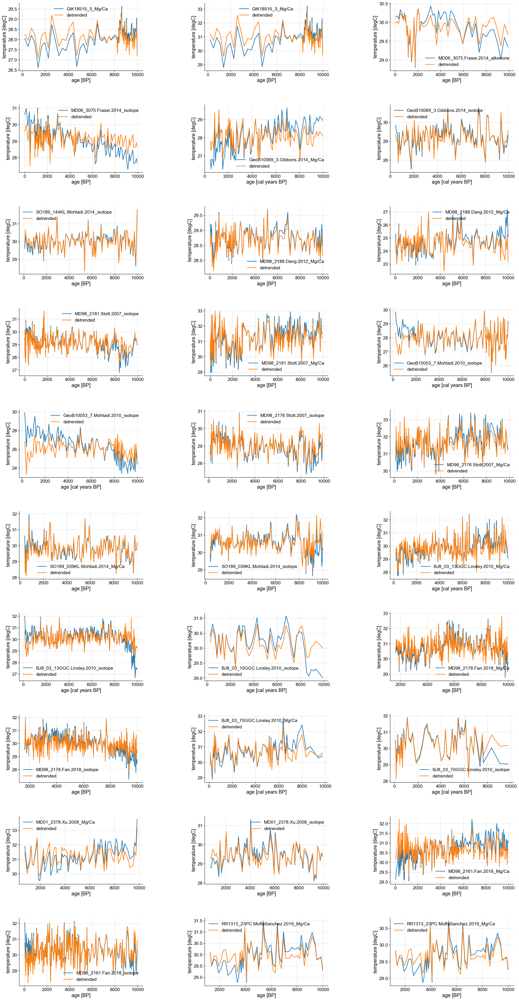

In [26]:
fig, axs = plt.subplots(10,3, figsize=(30,60))
fig.subplots_adjust(hspace = .5, wspace=.5)
axs = axs.ravel()

c=list(ts_dict_slice_long_filter.keys())

for i in range(30):
    ts_dict_slice_long[c[i]].plot(ax=axs[i])
    ts_dict_slice_long_filter[c[i]].plot(ax=axs[i], label='detrended')

The filtering method seems to do a good job at removing the trends across the database (without individual parameter tuning). Let's run our spectral analysis:

In [27]:
psd_dict_filter={}
for key in ts_dict_slice_long_filter.keys():
    psd_dict_filter[key]=ts_dict_slice_long_filter[key].standardize().spectral(method='lomb_scargle', freq_method='lomb_scargle').signif_test(number=5000)

Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:10<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:10<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:07<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:27<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:14<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:14<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:20<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:23<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:21<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:56<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:40<00:0
Performing spectral analysis on individual series: 100%|█| 5000/5000 [00:18<00:0
Performing spectral analysis

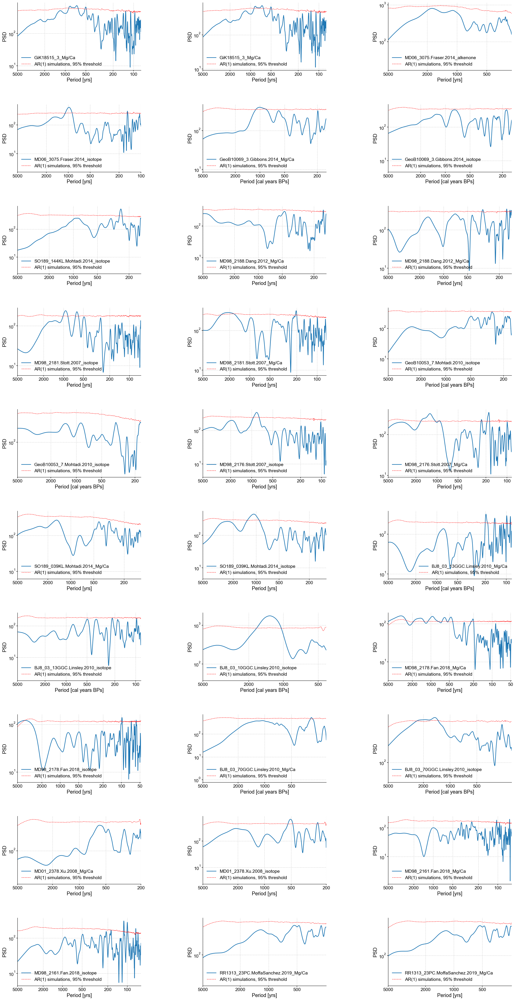

In [28]:
fig, axs = plt.subplots(10,3, figsize=(30,60))
fig.subplots_adjust(hspace = .5, wspace=.5)
axs = axs.ravel()

c=list(psd_dict_filter.keys())

for i in range(30):
    psd_dict_filter[c[i]].plot(xlim=[0,5000], ax=axs[i])
    axs[i].invert_xaxis()

Let's identify how many records have millennial-scale variability:

In [29]:
peaks = {}
peak_periods=[]
peak_present=[]

for key in psd_dict_filter.keys():
    peak_idx = find_peaks(psd_dict_filter[key].amplitude)[0]
    peak_period=[]
    for item in peak_idx:
        if psd_dict_filter[key].amplitude[item]>psd_dict_filter[key].signif_qs.psd_list[0].amplitude[item]:
            if (1./psd_dict_filter[key].frequency[item]>=750) & (1./psd_dict_filter[key].frequency[item]<=3000):
                peak_period.append(1./psd_dict_filter[key].frequency[item])               
    if len(peak_period)==0:
        peak_present.append(False)
    else:
        peak_present.append(True)
    peak_periods.append(peak_period)     

In [30]:
df_peaks_filter = df_final.copy()

df_peaks_filter['peak present']=peak_present
df_peaks_filter['peak period']=peak_periods

df_peaks_filter

,val,timeval,varunits,timeunits,dsname,lat,lon,alt,archive,varname,timevarname,QAlabel,medianRes,poxyLumps,proxyGeneral,proxyDetail,varID,peak present,peak period
0,"[28.05, 27.66, 28.2, 27.84, 26.62, 27.66, 27.8...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,age,True,50.000,NaN,Mg/Ca,ruber white,R6WsAc5ruph,True,[842.4000000000001]
1,"[30.7791, 30.199, 30.9603, 30.4859, 28.7948, 3...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,age,NaN,50.000,NaN,Mg/Ca,ruber white,R7fm0TgPac4_SST_from_planktic0x2EMgCa,True,[842.4000000000001]
4,"[nan, 30.1467919826531, nan, 30.1735219346169,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,age,NaN,160.000,NaN,alkenone,UK'37,T2L_MD06_3075_uk37_SST_from_uk37,False,[]
5,"[30.6218389925529, nan, 30.9747202389286, nan,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,age,NaN,60.000,NaN,isotope,ruber,T2L_MD06_3075_d18o_ruber_SST_from_d18o_ruber,True,[973.1343283582088]
6,"[26.7984, 26.2896, 26.841, 26.7689, 26.4507, 2...","[470.123, 544.246, 618.368, 692.491, 766.614, ...",degC,cal years BP,GeoB10069_3.Gibbons.2014,-9.0099,120.0153,-1250,MarineSediment,temperature,age,NaN,74.122,NaN,Mg/Ca,ruber,T2L_GeoB10069_3_mgca_ruber_SST_from_mgca_ruber,True,[1016.1746086956509]
7,"[29.8515875363455, 29.4545470170622, 29.466729...","[470.123, 544.246, 618.368, 692.491, 766.614, ...",degC,cal years BP,GeoB10069_3.Gibbons.2014,-9.0099,120.0153,-1250,MarineSediment,temperature,age,NaN,74.122,NaN,isotope,ruber,T2L_GeoB10069_3_d18o_ruber_SST_from_d18o_ruber,False,[]
8,"[29.6026764572587, 30.3623682354339, 29.990379...","[90.0, 145.0, 199.0, 254.0, 308.0, 363.0, 417....",degC,BP,SO189_144KL.Mohtadi.2014,1.1550,98.0660,-481,MarineSediment,temperature,age,NaN,74.000,NaN,isotope,ruber,T2L_SO189_144KL_d18o_ruber_SST_from_d18o_ruber,False,[]
11,"[29.2, 28.9, 28.8, 29.2, 29.0, 28.1, 28.3, 28....","[40.0, 80.0, 110.0, 140.0, 180.0, 210.0, 250.0...",degC,BP,MD98_2188.Dang.2012,14.8200,123.4900,-730,MarineSediment,temperature,age,NaN,70.000,NaN,Mg/Ca,ruber white,RVW8LmOBhyk,False,[]
12,"[25.3, 24.3, 24.4, 23.4, 23.9, 24.1, 24.9, 24....","[40.0, 80.0, 110.0, 140.0, 180.0, 210.0, 250.0...",degC,BP,MD98_2188.Dang.2012,14.8200,123.4900,-730,MarineSediment,temperature,age,NaN,70.000,NaN,Mg/Ca,P. obliquiloculata,RcqRo8jDUCp,False,[]
13,"[nan, 29.4983603571315, 28.5073400221219, 28.2...","[2.6, 7.8, 18.6, 29.8, 32.7, 41.4, 44.4, 53.5,...",degC,BP,MD98_2181.Stott.2007,6.3000,125.8200,-2114,MarineSediment,temperature,age,NaN,35.500,NaN,isotope,ruber,T2L_MD98_2181_d18o_ruber_SST_from_d18o_ruber,True,[930.5555555555555]


In [31]:
df_peaks_filter[df_peaks_filter['peak present']==True].shape[0]

12

Using a low-pass filter as a detrending technique, we find that 12 records have significant millennial-scale variability (up from 5), suggesting that pre-processing will have an impact on our conclusions and merit further investigation.

Text(0.5, 0, 'Periods (yrs)')

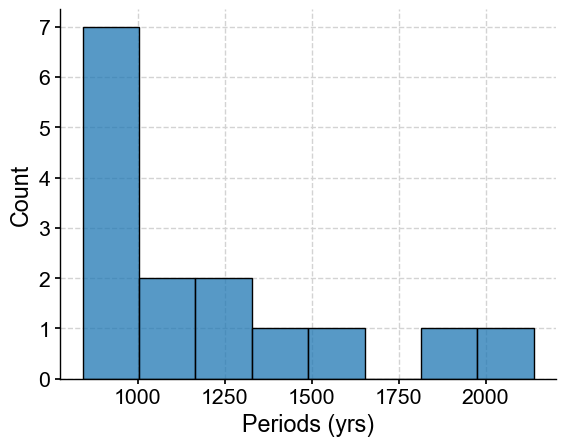

In [32]:
peaks_all=[]

for _,row in df_peaks_filter.iterrows():
    if len(row['peak period'])>0:
        for item in row['peak period']:
            peaks_all.append(item)

sns.histplot(peaks_all, bins=8)
plt.xlabel('Periods (yrs)')

Most records seemt to display variability around 1000 years but the location of the peak is likely insignificant given the small sample size. 

## <a name=discussion>Discussion</a>

The preliminary analysis of the IPWP records suggests the following:
* There may be significant millenial-scale variability within the region; however,
* The robustness of these conclusions seem to be highly dependent on the choice of detrending method, which deserves further investigation and most likely record-by-record parameter tuning.
* Other pre-processing methods (such as the [removal of outliers](https://pyleoclim-util.readthedocs.io/en/master/core/api.html#pyleoclim.core.series.Series.outliers)) should also be considered
* Some of the records in the dabase seem to have different calibration applied (e.g., GiK18515_3 record) to the same proxy record. More understanding of the calibration process is needed to assess whether calibration would affect the results of spectral analysis (e.g., Mg/Ca only vs Mg/Ca-$-delta^{18}O_{sw} to take into consideration the effect of salinity on the Mg/Ca proxy). If not, then these records should be treated as duplicates and remove prior to analysis. 
* We have only used the Lomb-Scargle method. The weighted-wavelet Z transform (WWZ) is also meant for unevenly-spaced data and it would be interesting to compare the results of the two methods. Similarly, using a multi-taper method after interpolation can be considered for analysis. 

We should also consider whether the detection of significant periodicity could be due to the resolution of the record or the record length.

### <a name=res>Effect of resolution</res>

In [36]:
MD81_mean_res = np.mean(np.diff(ts_MD81.time))

print('The average resolution for the MD98-2181 record is '+str(MD81_mean_res)+ ' years')

The average resolution for the MD98-2181 record is 29.050595238095237 years


In [41]:
mean_res = []
for key in ts_dict_slice_long_filter.keys():
    mean_res.append(np.mean(np.diff(ts_dict_slice_long_filter[key].time)))

df_peaks_filter['resolution']=mean_res

df_peaks_filter.head()

,val,timeval,varunits,timeunits,dsname,lat,lon,alt,archive,varname,timevarname,QAlabel,medianRes,poxyLumps,proxyGeneral,proxyDetail,varID,peak present,peak period,resolution
0,"[28.05, 27.66, 28.2, 27.84, 26.62, 27.66, 27.8...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,age,True,50.000,NaN,Mg/Ca,ruber white,R6WsAc5ruph,True,[842.4000000000001],122.012500
1,"[30.7791, 30.199, 30.9603, 30.4859, 28.7948, 3...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,age,NaN,50.000,NaN,Mg/Ca,ruber white,R7fm0TgPac4_SST_from_planktic0x2EMgCa,True,[842.4000000000001],122.012500
4,"[nan, 30.1467919826531, nan, 30.1735219346169,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,age,NaN,160.000,NaN,alkenone,UK'37,T2L_MD06_3075_uk37_SST_from_uk37,False,[],156.190476
5,"[30.6218389925529, nan, 30.9747202389286, nan,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,age,NaN,60.000,NaN,isotope,ruber,T2L_MD06_3075_d18o_ruber_SST_from_d18o_ruber,True,[973.1343283582088],61.481481
6,"[26.7984, 26.2896, 26.841, 26.7689, 26.4507, 2...","[470.123, 544.246, 618.368, 692.491, 766.614, ...",degC,cal years BP,GeoB10069_3.Gibbons.2014,-9.0099,120.0153,-1250,MarineSediment,temperature,age,NaN,74.122,NaN,Mg/Ca,ruber,T2L_GeoB10069_3_mgca_ruber_SST_from_mgca_ruber,True,[1016.1746086956509],84.637473


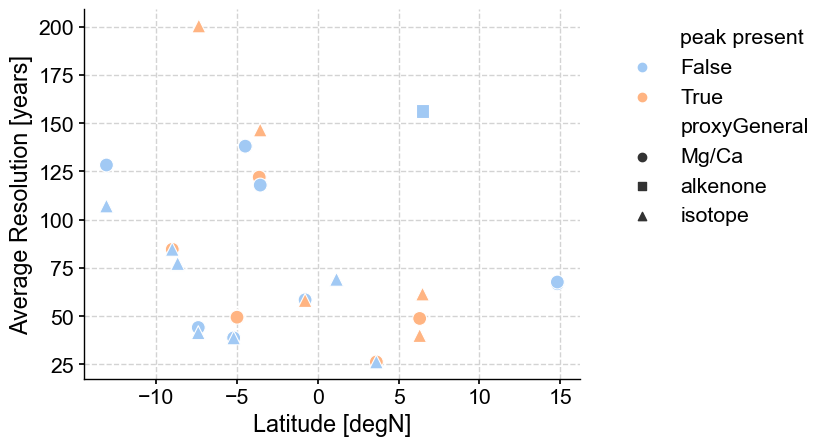

In [42]:
ax = sns.scatterplot(df_peaks_filter,x='lat',y='resolution',hue='peak present',style='proxyGeneral', markers=['o','s','^'], legend="brief", s=100, palette="pastel")
ax.set_xlabel('Latitude [degN]')
ax.set_ylabel('Average Resolution [years]')
ax.legend(loc='upper right', bbox_to_anchor=(1.5, 1))

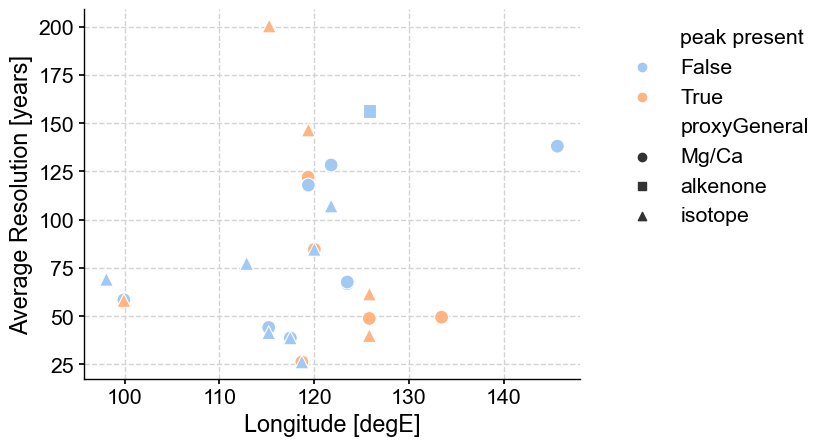

In [43]:
ax = sns.scatterplot(df_peaks_filter,x='lon',y='resolution',hue='peak present',style='proxyGeneral', markers=['o','s','^'], legend="brief", s=100, palette="pastel")
ax.set_xlabel('Longitude [degE]')
ax.set_ylabel('Average Resolution [years]')
ax.legend(loc='upper right', bbox_to_anchor=(1.5, 1))

Resolution doesn't seem to affect whether millennial scale variability is present in the record. It is interesting to note that some records with multiple proxies show different answers. This could be due to pre-processing. 

There also doesn't appear to be any geographical bias.

### <a name=length>Effect of record length</a>

In [45]:
length = []
for key in ts_dict_slice_long_filter.keys():
    length.append(np.max(ts_dict_slice_long_filter[key].time)-np.min(ts_dict_slice_long_filter[key].time))

df_peaks_filter['record_length']=length

df_peaks_filter.head()

,val,timeval,varunits,timeunits,dsname,lat,lon,alt,archive,varname,...,QAlabel,medianRes,poxyLumps,proxyGeneral,proxyDetail,varID,peak present,peak period,resolution,record_length
0,"[28.05, 27.66, 28.2, 27.84, 26.62, 27.66, 27.8...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,...,True,50.000,NaN,Mg/Ca,ruber white,R6WsAc5ruph,True,[842.4000000000001],122.012500,9761.000
1,"[30.7791, 30.199, 30.9603, 30.4859, 28.7948, 3...","[214.0, 502.0, 791.0, 1083.0, 1377.0, 1672.0, ...",degC,BP,GiK18515_3,-3.6298,119.3600,-688,MarineSediment,temperature,...,NaN,50.000,NaN,Mg/Ca,ruber white,R7fm0TgPac4_SST_from_planktic0x2EMgCa,True,[842.4000000000001],122.012500,9761.000
4,"[nan, 30.1467919826531, nan, 30.1735219346169,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,...,NaN,160.000,NaN,alkenone,UK'37,T2L_MD06_3075_uk37_SST_from_uk37,False,[],156.190476,9840.000
5,"[30.6218389925529, nan, 30.9747202389286, nan,...","[0.0, 60.0, 140.0, 190.0, 280.0, 330.0, 410.0,...",degC,BP,MD06_3075.Fraser.2014,6.4762,125.8320,-1878,MarineSediment,temperature,...,NaN,60.000,NaN,isotope,ruber,T2L_MD06_3075_d18o_ruber_SST_from_d18o_ruber,True,[973.1343283582088],61.481481,9960.000
6,"[26.7984, 26.2896, 26.841, 26.7689, 26.4507, 2...","[470.123, 544.246, 618.368, 692.491, 766.614, ...",degC,cal years BP,GeoB10069_3.Gibbons.2014,-9.0099,120.0153,-1250,MarineSediment,temperature,...,NaN,74.122,NaN,Mg/Ca,ruber,T2L_GeoB10069_3_mgca_ruber_SST_from_mgca_ruber,True,[1016.1746086956509],84.637473,9479.397


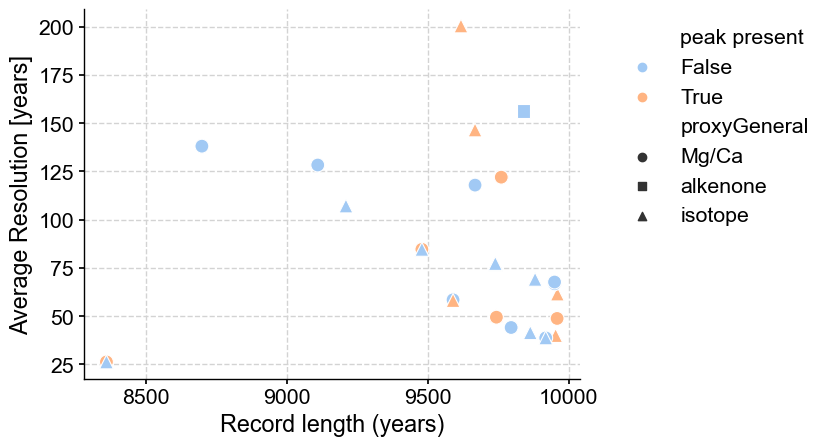

In [46]:
ax = sns.scatterplot(df_peaks_filter,x='record_length',y='resolution',hue='peak present',style='proxyGeneral', markers=['o','s','^'], legend="brief", s=100, palette="pastel")
ax.set_xlabel('Record length (years)')
ax.set_ylabel('Average Resolution [years]')
ax.legend(loc='upper right', bbox_to_anchor=(1.5, 1))

The length of the record also seems to have little impact on our results. 